In [72]:
#Import packages
import xarray as xr
import pandas as pd
import numpy as np
import datetime as dt
import s3fs
import geocat.comp
from datetime import datetime
import dask
import zarr
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import netCDF4
import os
import proplot as pplt
import warnings
from numpy import meshgrid, deg2rad, gradient, cos, sin
from xarray import DataArray
from scipy import stats
from sklearn.preprocessing import StandardScaler as scale
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from scipy.interpolate import griddata
import xesmf as xe
from sklearn import preprocessing
from tensorflow.keras.utils import to_categorical
warnings.filterwarnings('ignore')

2022-08-05 18:54:37.381045: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-08-05 18:54:37.381078: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
#3D detrend function
def detrend(x:np.ndarray,time:np.ndarray):
        nt,nx,ny = x.shape
        xtemp = x.reshape(nt,nx*ny)
        p = np.polyfit(time, xtemp, deg=3)
        fit = p[0]*(time[:,np.newaxis] **3)+ p[1]*(time[:,np.newaxis]**2) + p[2]*(time[:,np.newaxis]) + p[3]
        return x - fit.reshape(nt,nx,ny)
    
#1D detrend function
def altdetrend(x:np.ndarray,time:np.ndarray):
        nt = x.shape
        xtemp = x.reshape(nt)
        p = np.polyfit(time, x, deg=1)
        fit = p[0]*(time[:,np.newaxis])+ p[1]
        return x - fit.reshape(nt)
    
def remove_time_mean(x):
        return x - x.mean(dim='time')

def removeSC(x):
        return x.groupby('time.month').apply(remove_time_mean)
    
def calStdNorAnom(x):
    a=[]
    for m in np.unique(x.time.dt.month):
        mData=x[x.time.dt.month==m]
        mRolling=mData.rolling(time=31, center=True).mean().bfill(dim="time").ffill(dim="time")
        sRolling=mData.rolling(time=31, center=True).std().bfill(dim="time").ffill(dim="time")
        normData=(mData-mRolling)/sRolling
        a.append(normData)
    combineArray=xr.concat(a,'time')
    outArray=combineArray.sortby('time')
    return outArray

In [83]:
# Connect to AWS S3 storage
fs = s3fs.S3FileSystem(anon=True)
## By downloading the master CSV file enumerating all available data stores, we can interact with the spreadsheet
## through a pandas DataFrame to search and explore for relevant data using the CMIP6 controlled vocabulary:
df = pd.read_csv("https://cmip6-pds.s3.amazonaws.com/pangeo-cmip6.csv")


AttributeError: 'DataFrame' object has no attribute 'unique'

In [4]:
def getData(qstring):
    df_subset = df.query(qstring)
    if df_subset.empty:
        print('data not available for '+qstring)
    else:
        for v in df_subset.zstore.values:
            zstore = v
            mapper = fs.get_mapper(zstore)
            return_ds = xr.open_zarr(mapper, consolidated=True)
    return(return_ds)

In [5]:
modelName="'CESM2'"
institute="'NCAR'"
expList=["'historical'"]
actList=["'CMIP'"]
membList=["'r1i1p1f1'", "'r2i1p1f1'", "'r3i1p1f1'", "'r4i1p1f1'" , "'r5i1p1f1'", "'r6i1p1f1'", "'r7i1p1f1'","'r8i1p1f1'","'r9i1p1f1'","'r10i1p1f1'","'r11i1p1f1'"]

In [10]:
#Load in ERA5 data for land mask
files='/home/jupyter-dipti/work/ISMR_CITCZ/Data/Regrided_ERA5.nc'
data=xr.open_dataset(files)
land=data.lsMask

#land=land[:432,:,:]

(516, 181, 240)


In [84]:
inputStr  = "institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=='r1i1p1f1' & variable_id=="
rsut_ds   = getData(inputStr+"'rsut'") 
rsutcs_ds = getData(inputStr+"'rsutcs'")
rlut_ds   =getData(inputStr+"'rlut'")
rlutcs_ds   =getData(inputStr+"'rlutcs'")
rsdt_ds  =getData(inputStr+"'rsdt'")


cres= rsutcs_ds.rsutcs-rsut_ds.rsut

altinputStr  = "activity_id=='CMIP' & table_id=='fx' & source_id=='CESM2' & experiment_id=='historical' &  member_id=='r1i1p1f1' & variable_id=="
sftlf_ds = getData(altinputStr+"'sftlf'") 
land=sftlf_ds.sftlf
cres,land= xr.broadcast(cres,land)


pr_ds     = getData(inputStr+"'pr'")
prec=pr_ds.pr

precip=prec.sel(lon=slice(60,100),lat=slice(10,30))
land=land.sel(lon=slice(60,100),lat=slice(10,30))





In [78]:
creslist=[]
dummy_ylist=[]

for j,memb in enumerate(membList):
        inputStr  = "institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=="+memb+" & variable_id=="
        altinputStr  = "activity_id=='CMIP' & table_id=='fx' & source_id=='CESM2' & experiment_id=='historical' &  member_id=="+memb+" & variable_id=="
        rsut_ds   = getData(inputStr+"'rsut'")
        pr_ds     = getData(inputStr+"'pr'")
        rsutcs_ds = getData(inputStr+"'rsutcs'")
        sftlf_ds = getData(altinputStr+"'sftlf'")
        
        cres= rsutcs_ds.rsutcs-rsut_ds.rsut
        prec=pr_ds.pr
        land=sftlf_ds.sftlf
    
        
        datetimeindex=cres.indexes['time'].to_datetimeindex()
        cres['time']=datetimeindex
        prec['time']=datetimeindex
        
        cres,land= xr.broadcast(cres,land)
        
        cres=removeSC(cres)
        cres=calStdNorAnom(cres)
        
        time=cres.time
        
        #Try just selecting the indian ocean
        cres=cres.sel(lat=slice(-40,10))
        #crel=crel.sel(lat=slice(10,-40))
        #netTOAcs=netTOAcs.sel(lat=slice(10,-40))

        cres=cres.sel(lon=slice(40,115))
        #crel=crel.sel(lon=slice(40,115))
        #netTOAcs=netTOAcs.sel(lon=slice(40,115))
        
        lat=cres.lat
        lon=cres.lon
        
        months=[2]
        leadmonths=[6]

        #varOut.where(varOut.time.dt.month.isin(months), drop=True) #Change varOut to desired variable
        prec=prec.sel(time=prec.time.dt.month.isin(months))
        cres=cres.sel(time=cres.time.dt.month.isin(leadmonths))
        land=land.sel(time=land.time.dt.month.isin(months))
        
        #Select only the SAM lat,lon range: 60-100E, 10-30N
        precip=prec.sel(lon=slice(60,100),lat=slice(10,30))
        land=land.sel(lon=slice(60,100),lat=slice(10,30))
        
        precip=xr.where(land==0,np.nan,precip) #remove oceans, monsoon is defined as only over land 
        
        #Do weighted correction on precipitation
        weights=np.cos(np.deg2rad(precip.lat))
        prec_index=precip.weighted(weights).mean(dim=('lat','lon'))
        prec_index=prec_index*60*60*24 #conversion to mm/day, exluding dividing by rho and multiplying by 1000mm/m
        
        #Remove seasonal cycle
        prec_index=removeSC(prec_index)
        
        #Normalize
        prec_index=calStdNorAnom(prec_index)
        
        #Detrend
        time=prec_index.time
        prec_index=prec_index.to_numpy()
        cres=cres.to_numpy()
        time=time.to_numpy()
        time=time.astype(int)/10**9

        prec_index=altdetrend(prec_index,time)
        prec_index=xr.DataArray(prec_index,coords=[time],dims=['time'])
        
        cres=detrend(cres,time)
        cres=xr.DataArray(cres,coords=[time,lat,lon],dims=['time','lat','lon'])
        
        mysd=prec_index.std()
        mymean=prec_index.mean()

        buckets=pd.Categorical(pd.cut(prec_index, [mymean - mysd* 10000,  mymean - 0.5*mysd,  mymean + 0.5*mysd, mymean + mysd* 10000])).rename_categories(['low','average','high'])

        le = preprocessing.LabelEncoder()
        le.fit(buckets)

        labelprec=le.transform(buckets)

        # convert integers to dummy variables (i.e. one hot encoded)
        nclasses=3
        dummy_y=to_categorical(labelprec,nclasses) #converts to binary
        
        creslist.append(cres)
        cresstack=np.stack(creslist,axis=0)
        
        dummy_ylist.append(dummy_y)
        dummy_ystack=np.stack(dummy_ylist,axis=0)
        

In [79]:
dummy_ystack.shape

(11, 165, 3)

In [81]:
print(cresstack.shape)

(11, 165, 53, 61)


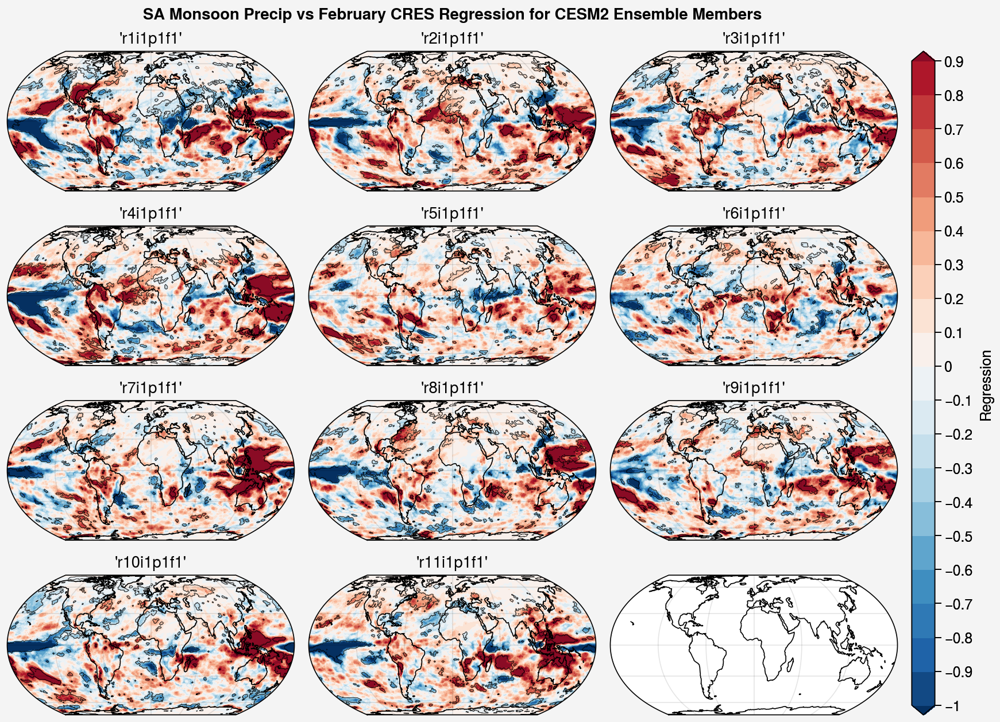

In [7]:
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
for j,memb in enumerate(membList):
        inputStr  = "institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=="+memb+" & variable_id=="
        altinputStr  = "activity_id=='CMIP' & table_id=='fx' & source_id=='CESM2' & experiment_id=='historical' &  member_id=='r1i1p1f1' & variable_id=="
        rsut_ds   = getData(inputStr+"'rsut'")
        pr_ds     = getData(inputStr+"'pr'")
        rsutcs_ds = getData(inputStr+"'rsutcs'")
        sftlf_ds = getData(altinputStr+"'sftlf'")

        cres= rsutcs_ds.rsutcs-rsut_ds.rsut
        prec=pr_ds.pr
        cres=cres[1548:,:,:]
        prec=prec[1548:,:,:]

        datetimeindex=cres.indexes['time'].to_datetimeindex()
        cres['time']=datetimeindex

        lat=prec.lat
        lon=prec.lon

        time=prec.time


        #Perhaps regrid everything to a standard grid then take out the land
        ds_target = xr.Dataset({'time':(['time'],time.data),'lat':(['lat'],lat.data),'lon':(['lon'],lon.data)})

        regridder = xe.Regridder(land,ds_target,'bilinear',periodic=True)
        regridland = regridder(land)
        regridland=xr.DataArray(regridland,coords=[time,lat,lon],dims=['time','lat','lon'])

        regridder1 = xe.Regridder(cres,ds_target,'bilinear',periodic=True)
        regridcres = regridder1(cres)
        cres=xr.DataArray(regridcres,coords=[time,lat,lon],dims=['time','lat','lon'])

        precip=xr.where(regridland==0,np.nan,prec) #remove oceans, monsoon is defined as only over land  


        #Select Monsoon Months
        months=[6,7,8,9]
        lagmonths=[2]
        #varOut.where(varOut.time.dt.month.isin(months), drop=True) #Change varOut to desired variable
        prec=precip.where(precip.time.dt.month.isin(months), drop=True)
        #land=regridland.where(regridland.time.dt.month.isin(months), drop=True)
        cres=cres.where(cres.time.dt.month.isin(lagmonths), drop=True)

        #Select only the SAM lat,lon range: 60-100E, 10-30N
        precip=prec.sel(lon=slice(60,100),lat=slice(10,30))

        #Do weighted correction on precipitation
        weights=np.cos(np.deg2rad(precip.lat))
        prec_index=precip.weighted(weights).mean(dim=('lat','lon'))
        prec_index=prec_index*60*60*24 #conversion to mm/day, exluding dividing by rho and multiplying by 1000mm/m

        #Remove seasonal cycle
        cres=removeSC(cres)
        prec_index=removeSC(prec_index)

        #Normalize
        cres=calStdNorAnom(cres)
        prec_index=calStdNorAnom(prec_index)

        
        #Convert time type 
        datetimeindex=cres.indexes['time'].to_datetimeindex()
        cres['time']=datetimeindex
        
        #Detrend data sets
        time=cres.time
        cres=cres.to_numpy()
        prec_index=prec_index.to_numpy()
        time=time.to_numpy()
        time=time.astype(int)/10**9

        cres=detrend(cres,time)
        cres=xr.DataArray(cres,coords=[time,lat,lon],dims=['time','lat','lon'])

        prec_index=altdetrend(prec_index,time)
        prec_index=xr.DataArray(prec_index,coords=[time],dims=['time'])

        mystd=prec_index.std()
        twostd=mystd*2
        mymean=prec_index.mean()
        condition=twostd+mymean

        pr_new,cres = xr.broadcast(prec_index,cres) #broadcast pr_mean array to fill array to allow regression to be executed
        
        #Calculate variable correlations
        corr=xr.corr(pr_new,cres,dim='time')
        fill=xr.zeros_like(corr) #Make array to be filled 
        fillarr=fill+1 #Make array full of ones

        corr1=xr.where(corr>0.3,fillarr,0) #Threshold value, above set to 1. Else=0 
        corr2=xr.where(corr<-0.3,fillarr,0) #Threshold value, below set to 1. Else=0

        #define the regression function
        def linear_trend(x,y): 
            mask=np.isfinite(x)&np.isfinite(y)
            if len(x[mask])==0:
                return np.nan
            else:
                pf=np.polyfit(x[mask],y[mask],1)
                return xr.DataArray(pf[0])

        def ints(x,y):
            mask=np.isfinite(x)&np.isfinite(y)
            if len(x[mask])==0:
                return np.nan
            else:
                ipf=np.polyfit(x[mask],y[mask],1)
                return xr.DataArray(ipf[1])


        #Apply regression function using ufunc to get regression coefficients/slopes
        slopes=xr.apply_ufunc(linear_trend,
                            pr_new,cres,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['time'],['time']],
                            )

        intercepts=xr.apply_ufunc(ints,
                            pr_new,cres,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['time'],['time']],
                            )


        regression=slopes*condition+intercepts

        con=axes[j].contourf(slopes.lon,slopes.lat,regression,levels=np.arange(-1,1,0.1),extend='both')
        corrs1=axes[j].contour(corr1.lon,corr1.lat,corr1,colors='black',linewidths=0.2,levels=2) #Contour 0.3 threshold correlation
        corrs2=axes[j].contour(corr1.lon,corr1.lat,corr2,colors='black',linewidths=0.2,levels=2) #Contour 0.3 threshold correlation

        axes[j].set_title(memb)

fig.format(coast=True)
cbar=plt.colorbar(con)
cbar.set_label('Regression')
axes.format(suptitle='SA Monsoon Precip vs February CRES Regression for CESM2 Ensemble Members')
fig.save('CESM_Ensemble_SAMonsoonPrec_Febcres_Regression')

In [ ]:
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
for j,memb in enumerate(membList):
        inputStr  = "institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=="+memb+" & variable_id=="
        rsut_ds   = getData(inputStr+"'rsut'")
        pr_ds     = getData(inputStr+"'pr'")
        rsutcs_ds = getData(inputStr+"'rsutcs'")
        #sftlf_ds = getData(altinputStr+"'sftlf'")

        cres= rsutcs_ds.rsutcs-rsut_ds.rsut
        prec=pr_ds.pr
        cres=cres[1548:,:,:]
        prec=prec[1548:,:,:]

        datetimeindex=cres.indexes['time'].to_datetimeindex()
        cres['time']=datetimeindex

        lat=prec.lat
        lon=prec.lon

        time=prec.time


        #Perhaps regrid everything to a standard grid then take out the land idk. 
        ds_target = xr.Dataset({'time':(['time'],time.data),'lat':(['lat'],lat.data),'lon':(['lon'],lon.data)})

        regridder = xe.Regridder(land,ds_target,'bilinear',periodic=True)
        regridland = regridder(land)
        regridland=xr.DataArray(regridland,coords=[time,lat,lon],dims=['time','lat','lon'])

        regridder1 = xe.Regridder(cres,ds_target,'bilinear',periodic=True)
        regridcres = regridder1(cres)
        cres=xr.DataArray(regridcres,coords=[time,lat,lon],dims=['time','lat','lon'])

        precip=xr.where(regridland==0,np.nan,prec) #remove oceans, monsoon is defined as only over land  


        #Select Monsoon Months
        months=[11]
        lagmonths=[8]
        #varOut.where(varOut.time.dt.month.isin(months), drop=True) #Change varOut to desired variable
        prec=precip.where(precip.time.dt.month.isin(months), drop=True)
        #land=regridland.where(regridland.time.dt.month.isin(months), drop=True)
        cres=cres.where(cres.time.dt.month.isin(lagmonths), drop=True)

        #Select only the SAM lat,lon range: 60-100E, 10-30N
        precip=prec.sel(lon=slice(225,250),lat=slice(40,60))

        #Do weighted correction on precipitation
        weights=np.cos(np.deg2rad(precip.lat))
        prec_index=precip.weighted(weights).mean(dim=('lat','lon'))
        prec_index=prec_index*60*60*24 #conversion to mm/day, exluding dividing by rho and multiplying by 1000mm/m

        #Remove seasonal cycle
        cres=removeSC(cres)
        prec_index=removeSC(prec_index)

        #Normalize
        cres=calStdNorAnom(cres)
        prec_index=calStdNorAnom(prec_index)

        
        #Convert time type 
        datetimeindex=cres.indexes['time'].to_datetimeindex()
        cres['time']=datetimeindex
        
        #Detrend data sets
        time=cres.time
        cres=cres.to_numpy()
        prec_index=prec_index.to_numpy()
        time=time.to_numpy()
        time=time.astype(int)/10**9

        cres=detrend(cres,time)
        cres=xr.DataArray(cres,coords=[time,lat,lon],dims=['time','lat','lon'])

        prec_index=altdetrend(prec_index,time)
        prec_index=xr.DataArray(prec_index,coords=[time],dims=['time'])

        mystd=prec_index.std()
        twostd=mystd*2
        mymean=prec_index.mean()
        condition=twostd+mymean

        pr_new,cres = xr.broadcast(prec_index,cres) #broadcast pr_mean array to fill array to allow regression to be executed

        #Calculate variable correlations
        corr=xr.corr(pr_new,cres,dim='time')
        fill=xr.zeros_like(corr) #Make array to be filled 
        fillarr=fill+1 #Make array full of ones

        corr1=xr.where(corr>0.3,fillarr,0) #Threshold value, above set to 1. Else=0 
        corr2=xr.where(corr<-0.3,fillarr,0) #Threshold value, below set to 1. Else=0

        #define the regression function
        def linear_trend(x,y): 
            mask=np.isfinite(x)&np.isfinite(y)
            if len(x[mask])==0:
                return np.nan
            else:
                pf=np.polyfit(x[mask],y[mask],1)
                return xr.DataArray(pf[0])

        def ints(x,y):
            mask=np.isfinite(x)&np.isfinite(y)
            if len(x[mask])==0:
                return np.nan
            else:
                ipf=np.polyfit(x[mask],y[mask],1)
                return xr.DataArray(ipf[1])


        #Apply regression function using ufunc to get regression coefficients/slopes
        slopes=xr.apply_ufunc(linear_trend,
                            pr_new,cres,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['time'],['time']],
                            )

        intercepts=xr.apply_ufunc(ints,
                            pr_new,cres,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['time'],['time']],
                            )


        regression=slopes*condition+intercepts

        con=axes[j].contourf(slopes.lon,slopes.lat,regression,levels=np.arange(-1,1,0.1),extend='both')
        corrs1=axes[j].contour(corr1.lon,corr1.lat,corr1,colors='black',linewidths=0.2,levels=2) #Contour 0.3 threshold correlation
        corrs2=axes[j].contour(corr1.lon,corr1.lat,corr2,colors='black',linewidths=0.2,levels=2) #Contour 0.3 threshold correlation

        axes[j].set_title(memb)

fig.format(coast=True)
cbar=plt.colorbar(con)
cbar.set_label('Regression')
axes.format(suptitle='Pacific NW November Precip vs August CRES Regression for CESM2 Ensemble Members')
fig.save('CESM_Ensemble_NovPacificNWPrec_Augcres_Regression')





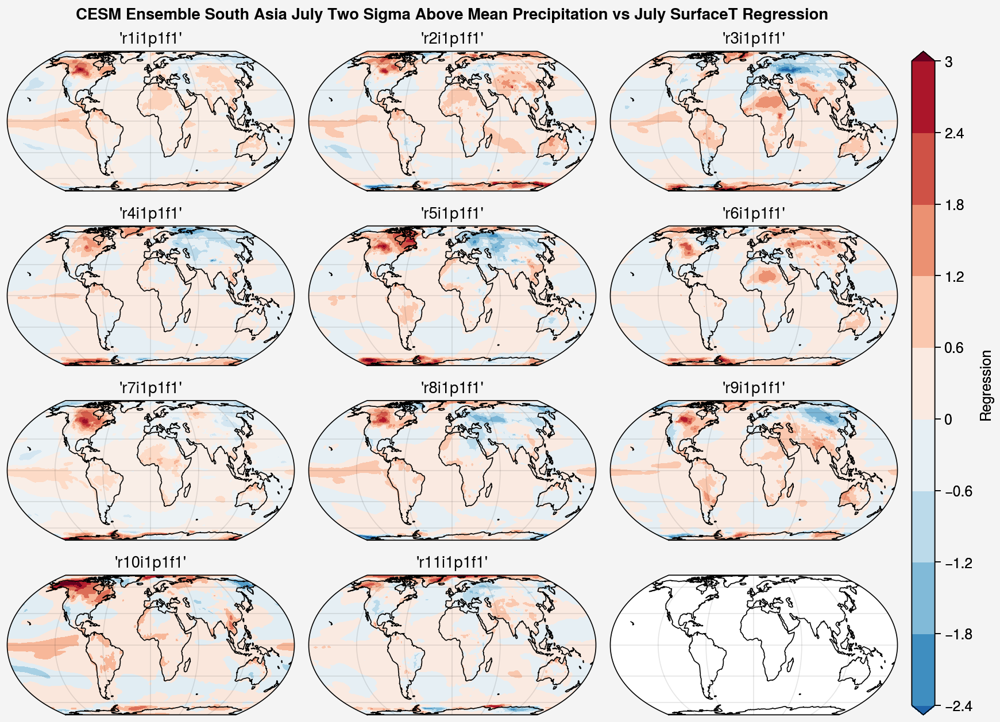

In [12]:
#Yearly Average
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
#fig,axes = pplt.subplots([[1,2],[3,4,5],[6,7,8],[9,10,11]],proj='eqearth')
for i,memb in enumerate(membList):
        inputStr  = "institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=="+memb+" & variable_id=="
        rsut_ds=getData(inputStr+"'rsut'")
        rsdt_ds=getData(inputStr+"'rsdt'")
        rsutcs_ds=getData(inputStr+"'rsutcs'")
        lats=rsut_ds['lat']
        lons=rsut_ds['lon']
        pr_ds=getData(inputStr+"'pr'")
        
        SurfaceT=ts_ds['ts']
        precip=pr_ds['pr']
        SurfaceT=SurfaceT[1548:,:,:]
        precip=precip[1548:,:,:]
        
        datetimeindex=SurfaceT.indexes['time'].to_datetimeindex()
        SurfaceT['time']=datetimeindex
        precip['time']=datetimeindex
        
    
        def detrend(x:np.ndarray,time:np.ndarray):
            nt,nx,ny = x.shape
            xtemp = x.reshape(nt,nx*ny)
            p = np.polyfit(time, xtemp, deg=3)
            fit = p[0]*(time[:,np.newaxis] **3)+ p[1]*(time[:,np.newaxis]**2) + p[2]*(time[:,np.newaxis]) + p[3]
            return x - fit.reshape(nt,nx,ny)
   

        #Do the weighted area correction:
        def earth_radius(lat):
            from numpy import deg2rad, sin, cos

            # define oblate spheroid from WGS84
            a = 6378137
            b = 6356752.3142
            e2 = 1 - (b**2/a**2)
    
        # convert from geodecic to geocentric
        # see equation 3-110 in WGS84
            lat = deg2rad(lat)
            lat_gc = np.arctan( (1-e2)*np.tan(lat) )
    
        # radius equation
        # see equation 3-107 in WGS84
            r = (
                (a * (1 - e2)**0.5) 
                / (1 - (e2 * np.cos(lat_gc)**2))**0.5 
                )
            
            return r

        def area_grid(lat, lon):
    
            from numpy import meshgrid, deg2rad, gradient, cos
            from xarray import DataArray

            xlon, ylat = meshgrid(lon, lat)
            R = earth_radius(ylat)
    
    
            dlat = deg2rad(gradient(ylat, axis=0))
            dlon = deg2rad(gradient(xlon, axis=1))
    
            dy = dlat * R
            dx = dlon * R * cos(deg2rad(ylat))
    
            area = dy * dx
    
            xda = DataArray(
                area,
                dims=["lat", "lon"],
                coords={"lat": lat, "lon": lon},
                attrs={
                    "long_name": "area_per_pixel",
                "description": "area per pixel",
                "units": "m^2",
                },
            )
            return xda
    
    
        da_area = area_grid(rsut_ds['lat'], rsut_ds['lon'])
        total_area=da_area.sum(['lat','lon'])

        #Select July index
        month_idxs=SurfaceT.groupby('time.month').groups
        july_idxs=month_idxs[7]
        test_idxs=month_idxs[4]
        SurfaceT_july=SurfaceT.isel(time=test_idxs)
        prec_july=precip.isel(time=july_idxs)


        SAMlat=SurfaceT_july.lat
        SAMlon=SurfaceT_july.lon

        #Detrend data sets
        time=SurfaceT_july.time
        SurfaceT_july=SurfaceT_july.to_numpy()
        time=time.to_numpy()
        prec_july=prec_july.to_numpy()

        time=time.astype(int)/10**9

        SurfaceT_july=detrend(SurfaceT_july,time)
        SurfaceT_july=xr.DataArray(SurfaceT_july,coords=[time,SAMlat,SAMlon],dims=['time','lat','lon'])

        prec_july=detrend(prec_july,time)
        prec_july=xr.DataArray(prec_july,coords=[time,SAMlat,SAMlon],dims=['time','lat','lon'])

        prec_july=xr.where(prec_july<0,0,prec_july) #apply Non-negative precipitation physical constraint

        #Select only the SAM lat,lon range: 60-100E, 10-30N 
        prec_july=prec_july.sel(lon=slice(60,100))
        prec_july=prec_july.sel(lat=slice(10,30))


        #Do weighted correction on precipitation
        prec_weighted=(prec_july*da_area)/total_area #Do the weighted area correction
        prec_weighted_mean=prec_weighted.sum(['lat','lon']) #Sum across lat lon to get the mean weighted value
        prec_index=prec_weighted_mean*60*60*24*365.25 #conversion to mm/yr, exluding dividing by rho and multiplying by 1000mm/m 

        mystd=prec_index.std()
        twostd=mystd*2
        mymean=prec_index.mean()
        condition=twostd+mymean

        pr_new,SurfaceT_july = xr.broadcast(prec_index,SurfaceT_july) #broadcast pr_mean array to fill array to allow regression to be executed
 
        #define the regression function
        def linear_trend(x,y): 
            mask=np.isfinite(x)&np.isfinite(y)
            if len(x[mask])==0:
                return np.nan
            else:
                pf=np.polyfit(x[mask],y[mask],1)
                return xr.DataArray(pf[0])

        def ints(x,y):
            mask=np.isfinite(x)&np.isfinite(y)
            if len(x[mask])==0:
                return np.nan
            else:
                ipf=np.polyfit(x[mask],y[mask],1)
                return xr.DataArray(ipf[1])


        #Apply regression function using ufunc to get regression coefficients/slopes
        slopes=xr.apply_ufunc(linear_trend,
                            pr_new,SurfaceT_july,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['time'],['time']],
                            )



        intercepts=xr.apply_ufunc(ints,
                            pr_new,SurfaceT_july,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['time'],['time']],
                            )


        regression=slopes*condition+intercepts

        con=axes[i].contourf(lons,lats,regression,extend='both')
        axes[i].set_title(memb)
fig.format(coast=True)
cbar=plt.colorbar(con)
cbar.set_label('Regression')
axes.format(suptitle='CESM Ensemble South Asia July Two Sigma Above Mean Precipitation vs July SurfaceT Regression')

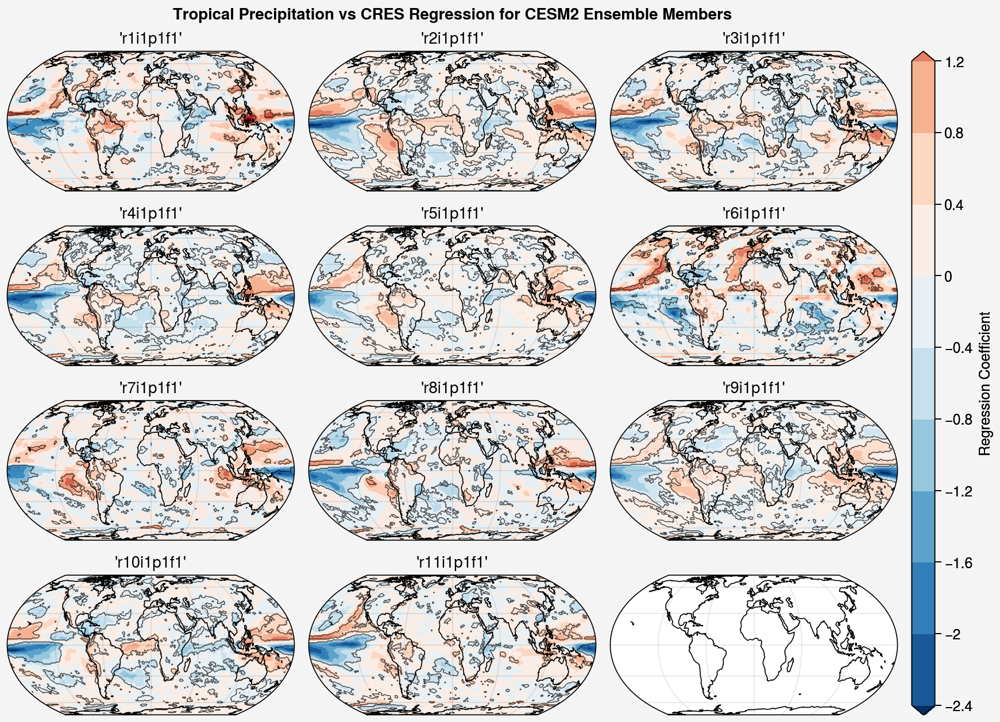

In [6]:
#Yearly Average
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
#fig,axes = pplt.subplots([[1,2],[3,4,5],[6,7,8],[9,10,11]],proj='eqearth')
for i,memb in enumerate(membList):
        inputStr  = "institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=="+memb+" & variable_id=="
        rsut_ds=getData(inputStr+"'rsut'")
        rsdt_ds=getData(inputStr+"'rsdt'")
        rsutcs_ds=getData(inputStr+"'rsutcs'")
        surfaceTemp=getData(inputStr+"'ts'")
        
        lats=rsut_ds['lat']
        lons=rsut_ds['lon']
        
        rsut=rsut_ds['rsut']
        rsutcs=rsutcs_ds['rsutcs']
        pr_ds=getData(inputStr+"'pr'")
        
        cres=rsutcs-rsut
        precip=pr_ds['pr']
        cres=cres[1548:,:,:]
        precip=precip[1548:,:,:]
        
        ds=cres
        month_length = ds.time.dt.days_in_month
        weights = (
             month_length.groupby("time.year") / month_length.groupby("time.year").sum()
        )
    
        def detrend(x:np.ndarray,time:np.ndarray):
            nt,nx,ny = x.shape
            xtemp = x.reshape(nt,nx*ny)
            p = np.polyfit(time, xtemp, deg=3)
            fit = p[0]*(time[:,np.newaxis] **3)+ p[1]*(time[:,np.newaxis]**2) + p[2]*(time[:,np.newaxis]) + p[3]
            return x - fit.reshape(nt,nx,ny)
   

        #Do the weighted area correction:
        def earth_radius(lat):
            from numpy import deg2rad, sin, cos

            # define oblate spheroid from WGS84
            a = 6378137
            b = 6356752.3142
            e2 = 1 - (b**2/a**2)
    
        # convert from geodecic to geocentric
        # see equation 3-110 in WGS84
            lat = deg2rad(lat)
            lat_gc = np.arctan( (1-e2)*np.tan(lat) )
    
        # radius equation
        # see equation 3-107 in WGS84
            r = (
                (a * (1 - e2)**0.5) 
                / (1 - (e2 * np.cos(lat_gc)**2))**0.5 
                )
            
            return r

        def area_grid(lat, lon):
    
            from numpy import meshgrid, deg2rad, gradient, cos
            from xarray import DataArray

            xlon, ylat = meshgrid(lon, lat)
            R = earth_radius(ylat)
    
    
            dlat = deg2rad(gradient(ylat, axis=0))
            dlon = deg2rad(gradient(xlon, axis=1))
    
            dy = dlat * R
            dx = dlon * R * cos(deg2rad(ylat))
    
            area = dy * dx
    
            xda = DataArray(
                area,
                dims=["lat", "lon"],
                coords={"lat": lat, "lon": lon},
                attrs={
                    "long_name": "area_per_pixel",
                "description": "area per pixel",
                "units": "m^2",
                },
            )
            return xda
    
    
        da_area = area_grid(rsut_ds['lat'], rsut_ds['lon'])
        total_area=da_area.sum(['lat','lon'])
        
        # Calculate the time weighted yearly average
        cres = (cres * weights).groupby("time.year").sum(dim="time")
        precip= (precip * weights).groupby("time.year").sum(dim="time")
    
        #Detrend data sets
        time=cres.year
        cres=cres.to_numpy()
        time=time.to_numpy()
        precip=precip.to_numpy()
    
        cres=detrend(cres,time)
        cres=xr.DataArray(cres,coords=[time,lats,lons],dims=['year','lat','lon'])
    
        precip=detrend(precip,time)
        precip=xr.DataArray(precip,coords=[time,lats,lons],dims=['year','lat','lon'])
    
        pr_tropical = precip.sel(lat=slice(-30,30))#Only look at tropical regions (30N-30S)
        prec_weighted=(pr_tropical*da_area)/total_area
        prec_weighted_mean=prec_weighted.sum(['lat','lon'])
        prec=prec_weighted_mean*60*60*24*365.25 #conversion to mm/yr
    
        pr_new,cres = xr.broadcast(prec,cres) #broadcast pr_mean array to fill array to allow regression to be executed
    
        corr=xr.corr(pr_new,cres,dim='year')
        test=xr.zeros_like(corr)
        testarr=test+1
    
        corr1=xr.where(corr>0.3,testarr,0)
        corr2=xr.where(corr<-0.3,testarr,0)
    
        
        #define the regression function
        def linear_trend(x,y): 
            pf=np.polyfit(x,y,1)
            return xr.DataArray(pf[0])
        
        #Apply regression function using ufunc to get regression coefficients/slopes
        slopes=xr.apply_ufunc(linear_trend,
                            pr_new,cres,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['year'],['year']],
                            )
    
    
        con=axes[i].contourf(lons,lats,slopes,extend='both')
        corrs1=axes[i].contour(lons,lats,corr1,colors='black',linewidths=0.05)
        corrs2=axes[i].contour(lons,lats,corr2,colors='black',linewidths=0.05)
        axes[i].set_title(memb)
    
 
fig.format(coast=True)
cbar=fig.colorbar(con)
cbar.set_label('Regression Coefficient')
axes.format(suptitle='Tropical Precipitation vs CRES Regression for CESM2 Ensemble Members')
fig.save('CESM2Ensemble_Tropical_Precip_vs_CRES_regression')        

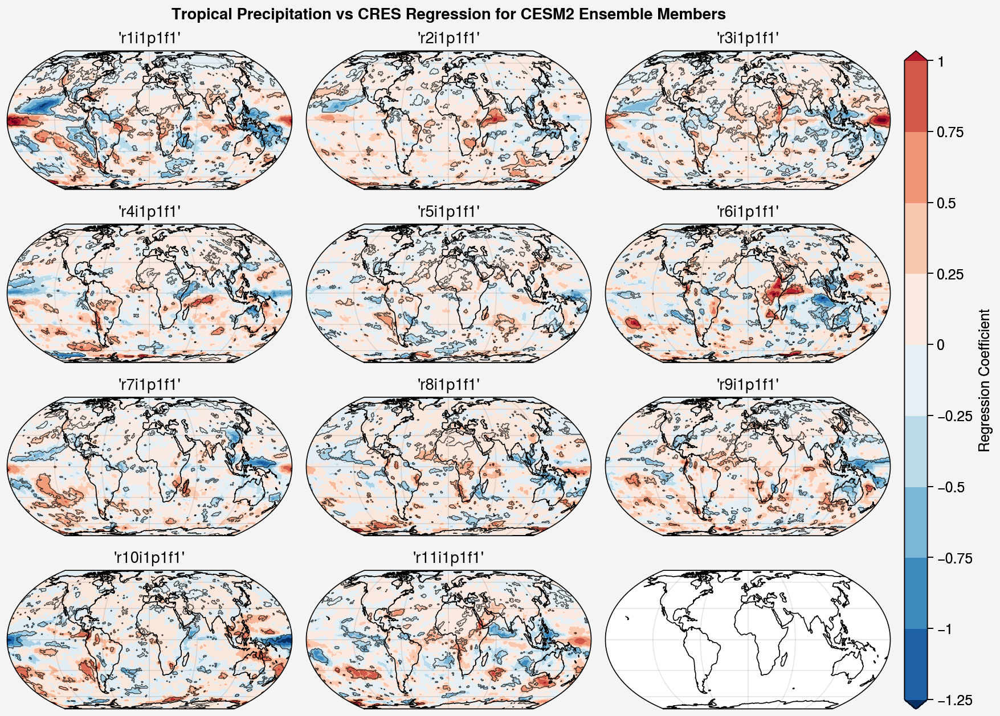

In [10]:
#January
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
#fig,axes = pplt.subplots([[1,2],[3,4,5],[6,7,8],[9,10,11]],proj='eqearth')
for i,memb in enumerate(membList):
        inputStr  = "institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=="+memb+" & variable_id=="
        rsut_ds=getData(inputStr+"'rsut'")
        rsdt_ds=getData(inputStr+"'rsdt'")
        rsutcs_ds=getData(inputStr+"'rsutcs'")
        
        lats=rsut_ds['lat']
        lons=rsut_ds['lon']
        
        rsut=rsut_ds['rsut']
        rsutcs=rsutcs_ds['rsutcs']
        pr_ds=getData(inputStr+"'pr'")
        
        cres=rsutcs-rsut
        precip=pr_ds['pr']
        cres=cres[1548:,:,:]
        precip=precip[1548:,:,:]
        
        datetimeindex=cres.indexes['time'].to_datetimeindex()
        cres['time']=datetimeindex
        precip['time']=datetimeindex
        
        month_idxs=cres.groupby('time.month').groups
        jan_idxs=month_idxs[1]
        

    
        def detrend(x:np.ndarray,time:np.ndarray):
            nt,nx,ny = x.shape
            xtemp = x.reshape(nt,nx*ny)
            p = np.polyfit(time, xtemp, deg=3)
            fit = p[0]*(time[:,np.newaxis] **3)+ p[1]*(time[:,np.newaxis]**2) + p[2]*(time[:,np.newaxis]) + p[3]
            return x - fit.reshape(nt,nx,ny)
   

        #Do the weighted area correction:
        def earth_radius(lat):
            from numpy import deg2rad, sin, cos

            # define oblate spheroid from WGS84
            a = 6378137
            b = 6356752.3142
            e2 = 1 - (b**2/a**2)
    
        # convert from geodecic to geocentric
        # see equation 3-110 in WGS84
            lat = deg2rad(lat)
            lat_gc = np.arctan( (1-e2)*np.tan(lat) )
    
        # radius equation
        # see equation 3-107 in WGS84
            r = (
                (a * (1 - e2)**0.5) 
                / (1 - (e2 * np.cos(lat_gc)**2))**0.5 
                )
            
            return r

        def area_grid(lat, lon):
    
            from numpy import meshgrid, deg2rad, gradient, cos
            from xarray import DataArray

            xlon, ylat = meshgrid(lon, lat)
            R = earth_radius(ylat)
    
    
            dlat = deg2rad(gradient(ylat, axis=0))
            dlon = deg2rad(gradient(xlon, axis=1))
    
            dy = dlat * R
            dx = dlon * R * cos(deg2rad(ylat))
    
            area = dy * dx
    
            xda = DataArray(
                area,
                dims=["lat", "lon"],
                coords={"lat": lat, "lon": lon},
                attrs={
                    "long_name": "area_per_pixel",
                "description": "area per pixel",
                "units": "m^2",
                },
            )
            return xda
    
    
        da_area = area_grid(rsut_ds['lat'], rsut_ds['lon'])
        total_area=da_area.sum(['lat','lon'])
        
        # Calculate only January times
        cres_jan=cres.isel(time=jan_idxs)
        prec_jan=precip.isel(time=jan_idxs)
        
        #Detrend data sets
        time=cres_jan.time
        cres_jan=cres_jan.to_numpy()
        time=time.to_numpy()
        prec_jan=prec_jan.to_numpy()
    
        time=time.astype(int)/10**9
    
        cres=detrend(cres_jan,time)
        cres=xr.DataArray(cres,coords=[time,lats,lons],dims=['time','lat','lon'])
    
        precip=detrend(prec_jan,time)
        precip=xr.DataArray(precip,coords=[time,lats,lons],dims=['time','lat','lon'])
        
        pr_tropical = precip.sel(lat=slice(-30,30))#Only look at tropical regions (30N-30S)
        prec_weighted=(pr_tropical*da_area)/total_area
        prec_weighted_mean=prec_weighted.sum(['lat','lon'])
        prec=prec_weighted_mean*60*60*24*365.25 #conversion to mm/yr
    
        pr_new,cres = xr.broadcast(prec,cres) #broadcast pr_mean array to fill array to allow regression to be executed
    
        corr=xr.corr(pr_new,cres,dim='time')
        test=xr.zeros_like(corr)
        testarr=test+1
    
        corr1=xr.where(corr>0.3,testarr,0)
        corr2=xr.where(corr<-0.3,testarr,0)
    
        
        #define the regression function
        def linear_trend(x,y): 
            pf=np.polyfit(x,y,1)
            return xr.DataArray(pf[0])
        
        #Apply regression function using ufunc to get regression coefficients/slopes
        slopes=xr.apply_ufunc(linear_trend,
                            pr_new,cres,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['time'],['time']],
                            )
    
    
        con=axes[i].contourf(lons,lats,slopes,extend='both')
        corrs1=axes[i].contour(lons,lats,corr1,colors='black',linewidths=0.05)
        corrs2=axes[i].contour(lons,lats,corr2,colors='black',linewidths=0.05)
        axes[i].set_title(memb)
    
 
fig.format(coast=True)
cbar=fig.colorbar(con)
cbar.set_label('Regression Coefficient')
axes.format(suptitle='Tropical Precipitation vs CRES Regression for CESM2 Ensemble Members')
fig.save('Jan_CESM2Ensemble_Tropical_Precip_vs_CRES_regression')        

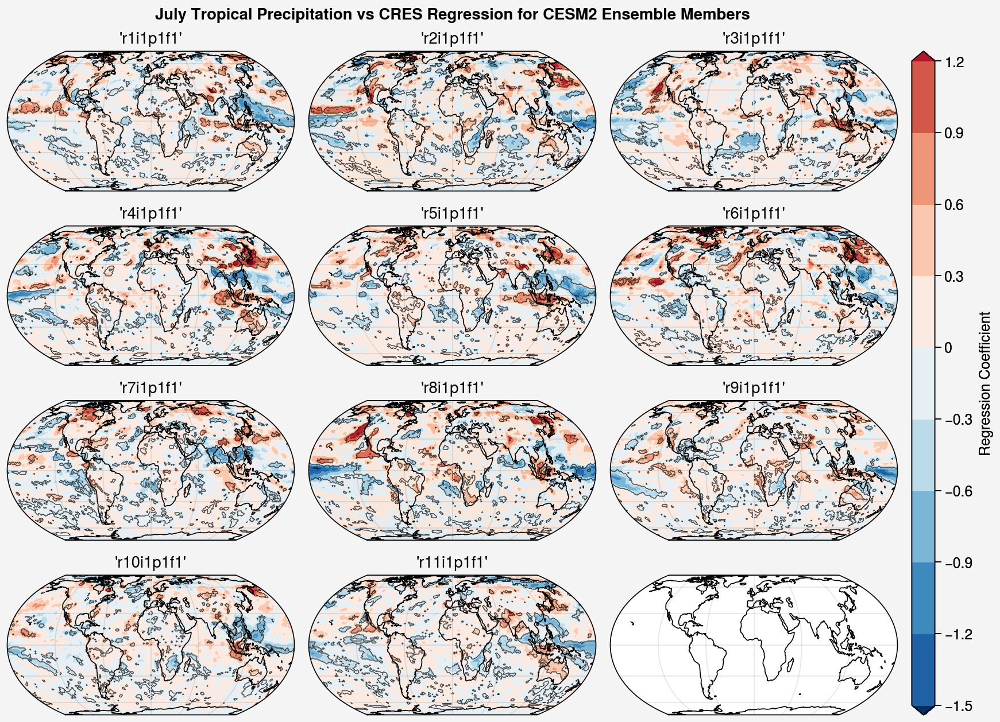

In [11]:
#July
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
#fig,axes = pplt.subplots([[1,2],[3,4,5],[6,7,8],[9,10,11]],proj='eqearth')
for i,memb in enumerate(membList):
        inputStr  = "institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=="+memb+" & variable_id=="
        rsut_ds=getData(inputStr+"'rsut'")
        rsdt_ds=getData(inputStr+"'rsdt'")
        rsutcs_ds=getData(inputStr+"'rsutcs'")
        
        lats=rsut_ds['lat']
        lons=rsut_ds['lon']
        
        rsut=rsut_ds['rsut']
        rsutcs=rsutcs_ds['rsutcs']
        pr_ds=getData(inputStr+"'pr'")
        
        cres=rsutcs-rsut
        precip=pr_ds['pr']
        cres=cres[1548:,:,:]
        precip=precip[1548:,:,:]
        
        datetimeindex=cres.indexes['time'].to_datetimeindex()
        cres['time']=datetimeindex
        precip['time']=datetimeindex
        
        month_idxs=cres.groupby('time.month').groups
        jan_idxs=month_idxs[7]
        

    
        def detrend(x:np.ndarray,time:np.ndarray):
            nt,nx,ny = x.shape
            xtemp = x.reshape(nt,nx*ny)
            p = np.polyfit(time, xtemp, deg=3)
            fit = p[0]*(time[:,np.newaxis] **3)+ p[1]*(time[:,np.newaxis]**2) + p[2]*(time[:,np.newaxis]) + p[3]
            return x - fit.reshape(nt,nx,ny)
   

        #Do the weighted area correction:
        def earth_radius(lat):
            from numpy import deg2rad, sin, cos

            # define oblate spheroid from WGS84
            a = 6378137
            b = 6356752.3142
            e2 = 1 - (b**2/a**2)
    
        # convert from geodecic to geocentric
        # see equation 3-110 in WGS84
            lat = deg2rad(lat)
            lat_gc = np.arctan( (1-e2)*np.tan(lat) )
    
        # radius equation
        # see equation 3-107 in WGS84
            r = (
                (a * (1 - e2)**0.5) 
                / (1 - (e2 * np.cos(lat_gc)**2))**0.5 
                )
            
            return r

        def area_grid(lat, lon):
    
            from numpy import meshgrid, deg2rad, gradient, cos
            from xarray import DataArray

            xlon, ylat = meshgrid(lon, lat)
            R = earth_radius(ylat)
    
    
            dlat = deg2rad(gradient(ylat, axis=0))
            dlon = deg2rad(gradient(xlon, axis=1))
    
            dy = dlat * R
            dx = dlon * R * cos(deg2rad(ylat))
    
            area = dy * dx
    
            xda = DataArray(
                area,
                dims=["lat", "lon"],
                coords={"lat": lat, "lon": lon},
                attrs={
                    "long_name": "area_per_pixel",
                "description": "area per pixel",
                "units": "m^2",
                },
            )
            return xda
    
    
        da_area = area_grid(rsut_ds['lat'], rsut_ds['lon'])
        total_area=da_area.sum(['lat','lon'])
        
        # Calculate only January times
        cres_jan=cres.isel(time=jan_idxs)
        prec_jan=precip.isel(time=jan_idxs)
        
        #Detrend data sets
        time=cres_jan.time
        cres_jan=cres_jan.to_numpy()
        time=time.to_numpy()
        prec_jan=prec_jan.to_numpy()
    
        time=time.astype(int)/10**9
    
        cres=detrend(cres_jan,time)
        cres=xr.DataArray(cres,coords=[time,lats,lons],dims=['time','lat','lon'])
    
        precip=detrend(prec_jan,time)
        precip=xr.DataArray(precip,coords=[time,lats,lons],dims=['time','lat','lon'])
        
        pr_tropical = precip.sel(lat=slice(-30,30))#Only look at tropical regions (30N-30S)
        prec_weighted=(pr_tropical*da_area)/total_area
        prec_weighted_mean=prec_weighted.sum(['lat','lon'])
        prec=prec_weighted_mean*60*60*24*365.25 #conversion to mm/yr
    
        pr_new,cres = xr.broadcast(prec,cres) #broadcast pr_mean array to fill array to allow regression to be executed
    
        corr=xr.corr(pr_new,cres,dim='time')
        test=xr.zeros_like(corr)
        testarr=test+1
    
        corr1=xr.where(corr>0.3,testarr,0)
        corr2=xr.where(corr<-0.3,testarr,0)
    
        
        #define the regression function
        def linear_trend(x,y): 
            pf=np.polyfit(x,y,1)
            return xr.DataArray(pf[0])
        
        #Apply regression function using ufunc to get regression coefficients/slopes
        slopes=xr.apply_ufunc(linear_trend,
                            pr_new,cres,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['time'],['time']],
                            )
    
    
        con=axes[i].contourf(lons,lats,slopes,extend='both')
        corrs1=axes[i].contour(lons,lats,corr1,colors='black',linewidths=0.05)
        corrs2=axes[i].contour(lons,lats,corr2,colors='black',linewidths=0.05)
        axes[i].set_title(memb)
    
 
fig.format(coast=True)
cbar=fig.colorbar(con)
cbar.set_label('Regression Coefficient')
axes.format(suptitle='July Tropical Precipitation vs CRES Regression for CESM2 Ensemble Members')
fig.save('July_CESM2Ensemble_Tropical_Precip_vs_CRES_regression')        

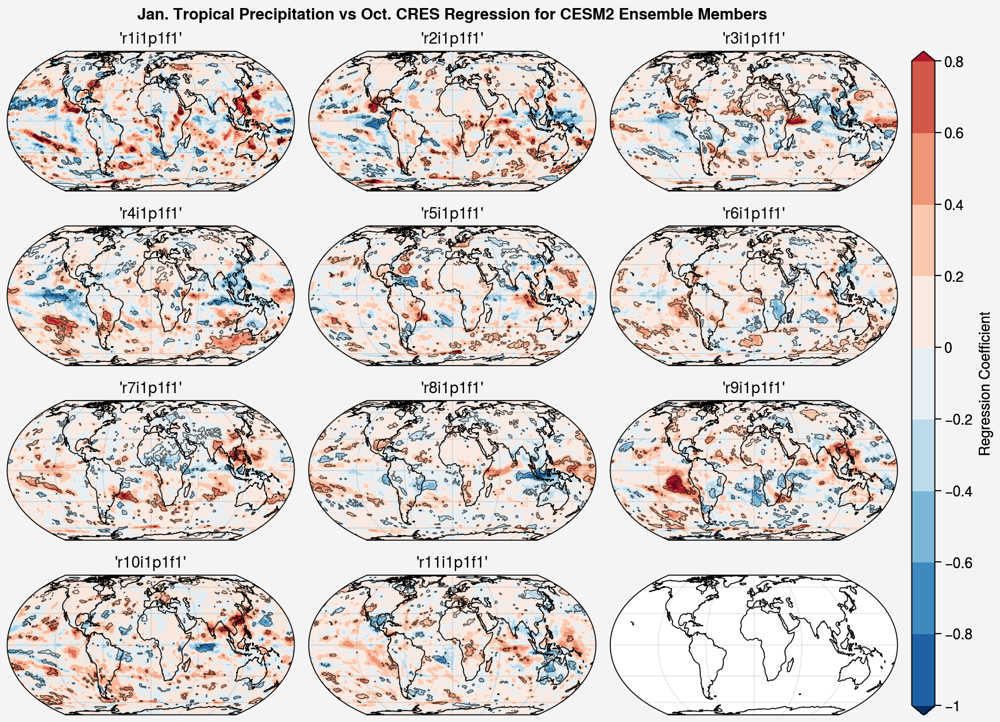

In [13]:
#Lead Lag
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
#fig,axes = pplt.subplots([[1,2],[3,4,5],[6,7,8],[9,10,11]],proj='eqearth')
for i,memb in enumerate(membList):
        inputStr  = "institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=="+memb+" & variable_id=="
        rsut_ds=getData(inputStr+"'rsut'")
        rsdt_ds=getData(inputStr+"'rsdt'")
        rsutcs_ds=getData(inputStr+"'rsutcs'")
        
        lats=rsut_ds['lat']
        lons=rsut_ds['lon']
        
        rsut=rsut_ds['rsut']
        rsutcs=rsutcs_ds['rsutcs']
        pr_ds=getData(inputStr+"'pr'")
        
        cres=rsutcs-rsut
        precip=pr_ds['pr']
        cres=cres[1548:,:,:]
        precip=precip[1548:,:,:]
        
        datetimeindex=cres.indexes['time'].to_datetimeindex()
        cres['time']=datetimeindex
        precip['time']=datetimeindex
        
        month_idxs=cres.groupby('time.month').groups
        jan_idxs=month_idxs[1]
        oct_idxs=month_idxs[10]
        

    
        def detrend(x:np.ndarray,time:np.ndarray):
            nt,nx,ny = x.shape
            xtemp = x.reshape(nt,nx*ny)
            p = np.polyfit(time, xtemp, deg=3)
            fit = p[0]*(time[:,np.newaxis] **3)+ p[1]*(time[:,np.newaxis]**2) + p[2]*(time[:,np.newaxis]) + p[3]
            return x - fit.reshape(nt,nx,ny)
   

        #Do the weighted area correction:
        def earth_radius(lat):
            from numpy import deg2rad, sin, cos

            # define oblate spheroid from WGS84
            a = 6378137
            b = 6356752.3142
            e2 = 1 - (b**2/a**2)
    
        # convert from geodecic to geocentric
        # see equation 3-110 in WGS84
            lat = deg2rad(lat)
            lat_gc = np.arctan( (1-e2)*np.tan(lat) )
    
        # radius equation
        # see equation 3-107 in WGS84
            r = (
                (a * (1 - e2)**0.5) 
                / (1 - (e2 * np.cos(lat_gc)**2))**0.5 
                )
            
            return r

        def area_grid(lat, lon):
    
            from numpy import meshgrid, deg2rad, gradient, cos
            from xarray import DataArray

            xlon, ylat = meshgrid(lon, lat)
            R = earth_radius(ylat)
    
    
            dlat = deg2rad(gradient(ylat, axis=0))
            dlon = deg2rad(gradient(xlon, axis=1))
    
            dy = dlat * R
            dx = dlon * R * cos(deg2rad(ylat))
    
            area = dy * dx
    
            xda = DataArray(
                area,
                dims=["lat", "lon"],
                coords={"lat": lat, "lon": lon},
                attrs={
                    "long_name": "area_per_pixel",
                "description": "area per pixel",
                "units": "m^2",
                },
            )
            return xda
    
    
        da_area = area_grid(rsut_ds['lat'], rsut_ds['lon'])
        total_area=da_area.sum(['lat','lon'])
        
        # Calculate only desired month data
        cres_oct=cres.isel(time=oct_idxs)
        prec_jan=precip.isel(time=jan_idxs)
    
        prec_jan['time']=cres_oct.time #to align times
        #Detrend data sets
        time=cres_oct.time
        cres_oct=cres_oct.to_numpy()
        time=time.to_numpy()
        prec_jan=prec_jan.to_numpy()

        time=time.astype(int)/10**9

        cres_oct=detrend(cres_oct,time)
        cres=xr.DataArray(cres_oct,coords=[time,lats,lons],dims=['time','lat','lon'])
        
        precip=detrend(prec_jan,time)
        precip=xr.DataArray(precip,coords=[time,lats,lons],dims=['time','lat','lon'])
        
        pr_tropical = precip.sel(lat=slice(-30,30))#Only look at tropical regions (30N-30S)
        prec_weighted=(pr_tropical*da_area)/total_area
        prec_weighted_mean=prec_weighted.sum(['lat','lon'])
        prec=prec_weighted_mean*60*60*24*365.25 #conversion to mm/yr
    
        pr_new,cres = xr.broadcast(prec,cres) #broadcast pr_mean array to fill array to allow regression to be executed
    
        corr=xr.corr(pr_new,cres,dim='time')
        test=xr.zeros_like(corr)
        testarr=test+1
    
        corr1=xr.where(corr>0.3,testarr,0)
        corr2=xr.where(corr<-0.3,testarr,0)
    
        
        #define the regression function
        def linear_trend(x,y): 
            pf=np.polyfit(x,y,1)
            return xr.DataArray(pf[0])
        
        #Apply regression function using ufunc to get regression coefficients/slopes
        slopes=xr.apply_ufunc(linear_trend,
                            pr_new,cres,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['time'],['time']],
                            )
    
    
        con=axes[i].contourf(lons,lats,slopes,extend='both')
        corrs1=axes[i].contour(lons,lats,corr1,colors='black',linewidths=0.05)
        corrs2=axes[i].contour(lons,lats,corr2,colors='black',linewidths=0.05)
        axes[i].set_title(memb)
    
 
fig.format(coast=True)
cbar=fig.colorbar(con)
cbar.set_label('Regression Coefficient')
axes.format(suptitle='Jan. Tropical Precipitation vs Oct. CRES Regression for CESM2 Ensemble Members')
fig.save('LeadLag_CESM2Ensemble_Tropical_Precip_vs_CRES_regression')        

data not available for institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=='r2i1p1f1' & variable_id=='rsuscs'


UnboundLocalError: local variable 'return_ds' referenced before assignment

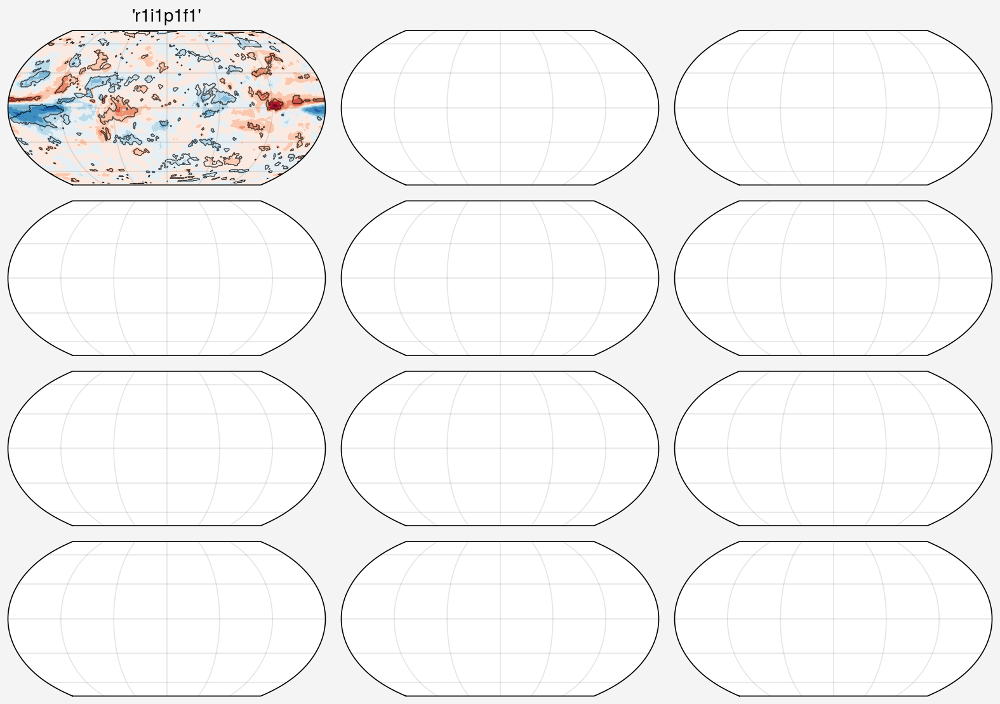

In [54]:
#Can't calculate cresSurf, variables aren't available????
fig,axes = pplt.subplots([[1,2,3],[4,5,6],[7,8,9],[10,11,12]],proj='eqearth')
#fig,axes = pplt.subplots([[1,2],[3,4,5],[6,7,8],[9,10,11]],proj='eqearth')
for i,memb in enumerate(membList):
        inputStr  = "institution_id =='NCAR' & source_id=='CESM2' & table_id=='Amon' & experiment_id=='historical' &  member_id=="+memb+" & variable_id=="
        rsds_ds=getData(inputStr+"'rsds'")
        rsus_ds=getData(inputStr+"'rsus'")
        #rsuscs_ds=getData(inputStr+"'rsuscs'") #Not available???
        #rsdscs_ds=getData(inputStr+"'rsdscs'")
        
        lats=rsut_ds['lat']
        lons=rsut_ds['lon']

        rsds=rsds_ds['rsds']
        rsdscs=rsdscs_ds['rsdscs']
        rsus=rsus_ds['rsus']
        rsuscs=rsuscs_ds['rsuscs'] 
    
        pr_ds=getData(inputStr+"'pr'")
        
        cresSurf=(rsds-rsus)-(rsdscs-rsuscs)
        
        precip=pr_ds['pr']
        cresSurf=cresSurf[1548:,:,:]
        precip=precip[1548:,:,:]
        
        ds=cresSurf
        month_length = ds.time.dt.days_in_month
        weights = (
             month_length.groupby("time.year") / month_length.groupby("time.year").sum()
        )
    
        def detrend(x:np.ndarray,time:np.ndarray):
            nt,nx,ny = x.shape
            xtemp = x.reshape(nt,nx*ny)
            p = np.polyfit(time, xtemp, deg=3)
            fit = p[0]*(time[:,np.newaxis] **3)+ p[1]*(time[:,np.newaxis]**2) + p[2]*(time[:,np.newaxis]) + p[3]
            return x - fit.reshape(nt,nx,ny)
   

        #Do the weighted area correction:
        def earth_radius(lat):
            from numpy import deg2rad, sin, cos

            # define oblate spheroid from WGS84
            a = 6378137
            b = 6356752.3142
            e2 = 1 - (b**2/a**2)
    
        # convert from geodecic to geocentric
        # see equation 3-110 in WGS84
            lat = deg2rad(lat)
            lat_gc = np.arctan( (1-e2)*np.tan(lat) )
    
        # radius equation
        # see equation 3-107 in WGS84
            r = (
                (a * (1 - e2)**0.5) 
                / (1 - (e2 * np.cos(lat_gc)**2))**0.5 
                )
            
            return r

        def area_grid(lat, lon):
    
            from numpy import meshgrid, deg2rad, gradient, cos
            from xarray import DataArray

            xlon, ylat = meshgrid(lon, lat)
            R = earth_radius(ylat)
    
    
            dlat = deg2rad(gradient(ylat, axis=0))
            dlon = deg2rad(gradient(xlon, axis=1))
    
            dy = dlat * R
            dx = dlon * R * cos(deg2rad(ylat))
    
            area = dy * dx
    
            xda = DataArray(
                area,
                dims=["lat", "lon"],
                coords={"lat": lat, "lon": lon},
                attrs={
                    "long_name": "area_per_pixel",
                "description": "area per pixel",
                "units": "m^2",
                },
            )
            return xda
    
    
        da_area = area_grid(rsut_ds['lat'], rsut_ds['lon'])
        total_area=da_area.sum(['lat','lon'])
        
        # Calculate the time weighted yearly average
        cresSurf = (cresSurf * weights).groupby("time.year").sum(dim="time")
        precip= (precip * weights).groupby("time.year").sum(dim="time")
    
        #Detrend data sets
        time=cresSurf.year
        cresSurf=cresSurf.to_numpy()
        time=time.to_numpy()
        precip=precip.to_numpy()
    
        cresSurf=detrend(cresSurf,time)
        cresSurf=xr.DataArray(cresSurf,coords=[time,lats,lons],dims=['year','lat','lon'])
    
        precip=detrend(precip,time)
        precip=xr.DataArray(precip,coords=[time,lats,lons],dims=['year','lat','lon'])
    
        pr_tropical = precip.sel(lat=slice(-30,30))#Only look at tropical regions (30N-30S)
        prec_weighted=(pr_tropical*da_area)/total_area
        prec_weighted_mean=prec_weighted.sum(['lat','lon'])
        prec=prec_weighted_mean*60*60*24*365.25 #conversion to mm/yr
    
        pr_new,cresSurf = xr.broadcast(prec,cresSurf) #broadcast pr_mean array to fill array to allow regression to be executed
    
        corr=xr.corr(pr_new,cresSurf,dim='year')
        test=xr.zeros_like(corr)
        testarr=test+1
    
        corr1=xr.where(corr>0.3,testarr,0)
        corr2=xr.where(corr<-0.3,testarr,0)
    
        
        #define the regression function
        def linear_trend(x,y): 
            pf=np.polyfit(x,y,1)
            return xr.DataArray(pf[0])
        
        #Apply regression function using ufunc to get regression coefficients/slopes
        slopes=xr.apply_ufunc(linear_trend,
                            pr_new,cresSurf,
                            vectorize=True,
                            dask='parallelized',
                            input_core_dims=[['year'],['year']],
                            )
    
    
        con=axes[i].contourf(lons,lats,slopes,extend='both')
        corrs1=axes[i].contour(lons,lats,corr1,colors='black',linewidths=0.05)
        corrs2=axes[i].contour(lons,lats,corr2,colors='black',linewidths=0.05)
        axes[i].set_title(memb)
    
 
fig.format(coast=True)
cbar=fig.colorbar(con)
cbar.set_label('Regression Coefficient')
axes.format(suptitle='Tropical Precipitation vs cresSurf Regression for CESM2 Ensemble Members')
#fig.save('Tropical_Precip_vs_cresSurf_regression')        